In [1]:
import json

# Example current format data
with open('alphapose-results-mild.json','rb') as fh:
    data = json.load(fh)
data

[{'image_id': '0.jpg',
  'category_id': 1,
  'keypoints': [236.8799285888672,
   240.7841339111328,
   0.04396011680364609,
   142.56161499023438,
   481.8198547363281,
   0.03249524533748627,
   299.7588195800781,
   314.142822265625,
   0.020250927656888962,
   624.633056640625,
   523.7390747070312,
   0.09153254330158234,
   352.15789794921875,
   314.142822265625,
   0.08589286357164383,
   215.92030334472656,
   1152.5279541015625,
   0.011825153604149818,
   184.48086547851562,
   492.2996520996094,
   0.1346578299999237,
   677.0321044921875,
   1257.3260498046875,
   0.4735686182975769,
   666.5523071289062,
   1246.8463134765625,
   0.3391413986682892,
   425.5165710449219,
   838.133544921875,
   0.15024280548095703,
   404.55694580078125,
   827.6536865234375,
   0.5259883999824524,
   289.27899169921875,
   282.7033996582031,
   0.08853430300951004,
   477.9156494140625,
   1005.810546875,
   0.0702514797449112,
   48.2432861328125,
   345.582275390625,
   0.12294041365385

In [2]:

# Initialize MMSkeleton format
mmskeleton_data = {
    "data": {
        "keypoint": []
    },
    "frame_dir": "video_name",  # Set video name here
    "img_shape": [720, 1280],  # Example: height and width of the video
    "original_shape": [720, 1280],
    "total_frames": len(data)
}


In [3]:
bounding = []
# Process each frame and extract keypoints
for frame_data in data:
    keypoints = frame_data["keypoints"]
    frame_keypoints = []
    # Group keypoints in sets of 3 (x, y, confidence)
    for i in range(0, len(keypoints), 3):
        frame_keypoints.append([keypoints[i], keypoints[i + 1], keypoints[i + 2]])
    # Append to the keypoint list in MMSkeleton format
    mmskeleton_data["data"]["keypoint"].append([frame_keypoints])
    bounding.append(frame_data["box"])

# Example label for the video, adjust accordingly
mmskeleton_data["data"]["label"] = 0

# Convert to JSON
json_data = json.dumps(mmskeleton_data, indent=4)
print(json_data)
print(bounding)

{
    "data": {
        "keypoint": [
            [
                [
                    [
                        236.8799285888672,
                        240.7841339111328,
                        0.04396011680364609
                    ],
                    [
                        142.56161499023438,
                        481.8198547363281,
                        0.03249524533748627
                    ],
                    [
                        299.7588195800781,
                        314.142822265625,
                        0.020250927656888962
                    ],
                    [
                        624.633056640625,
                        523.7390747070312,
                        0.09153254330158234
                    ],
                    [
                        352.15789794921875,
                        314.142822265625,
                        0.08589286357164383
                    ],
                    [
                        215.92030

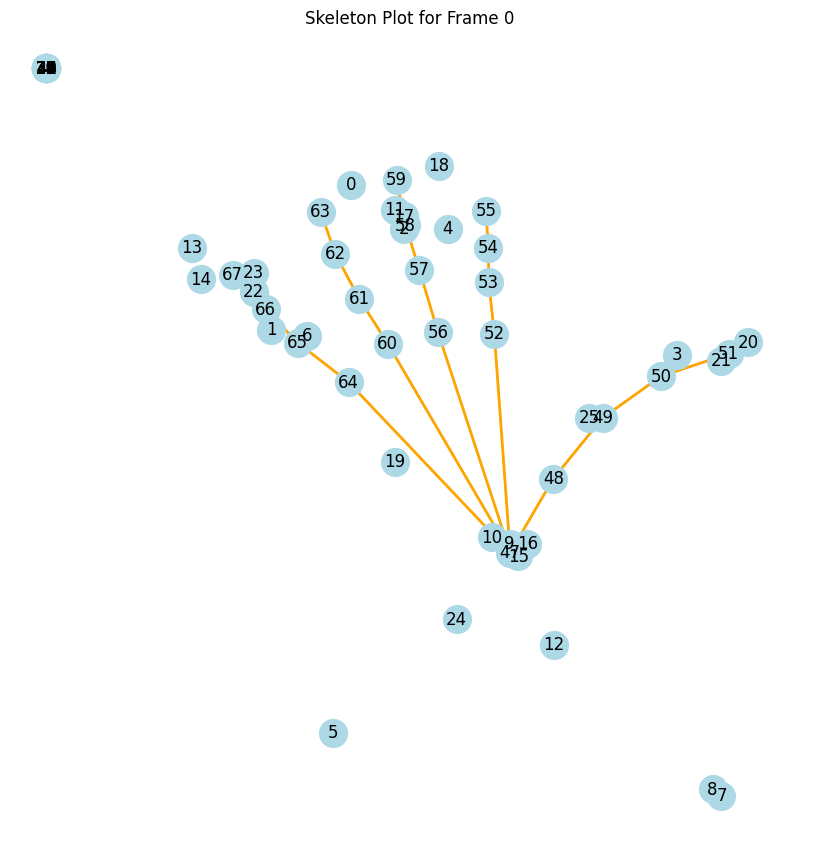

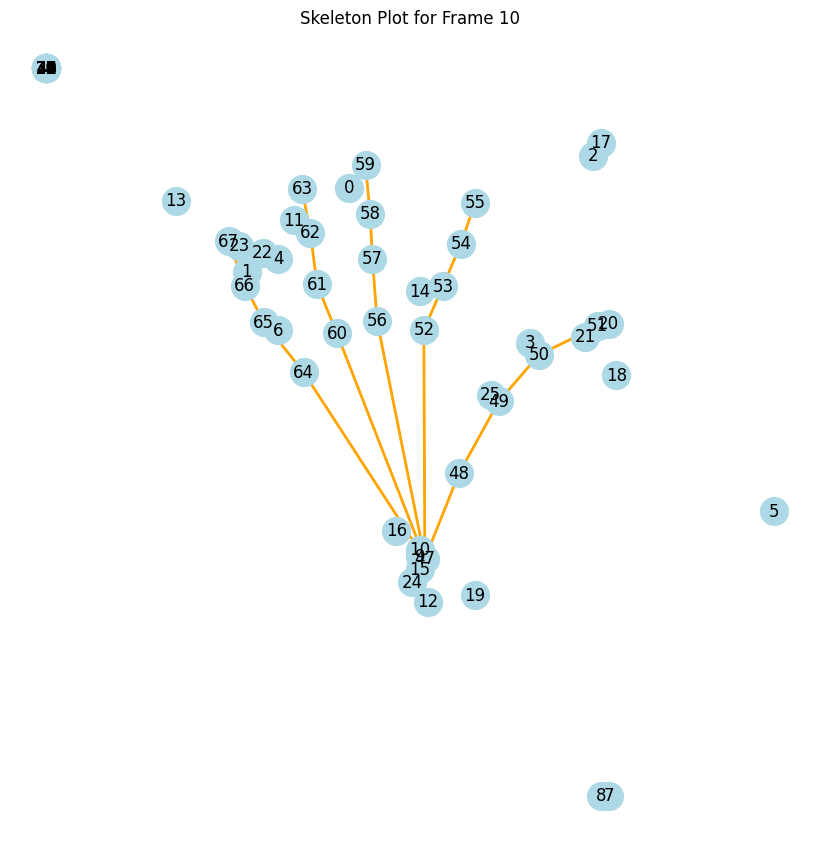

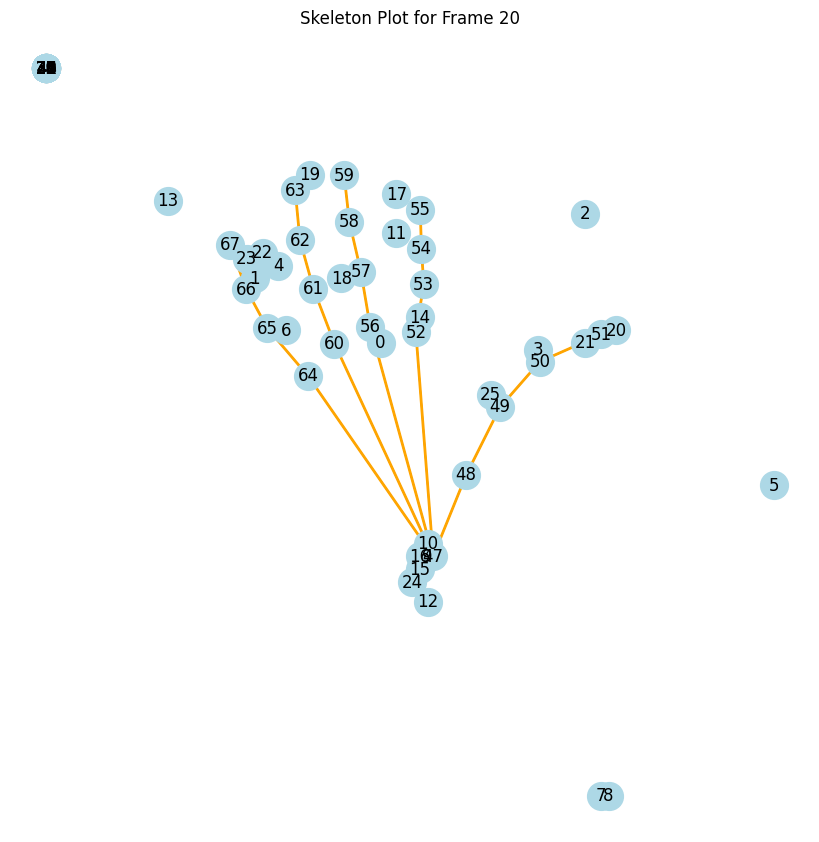

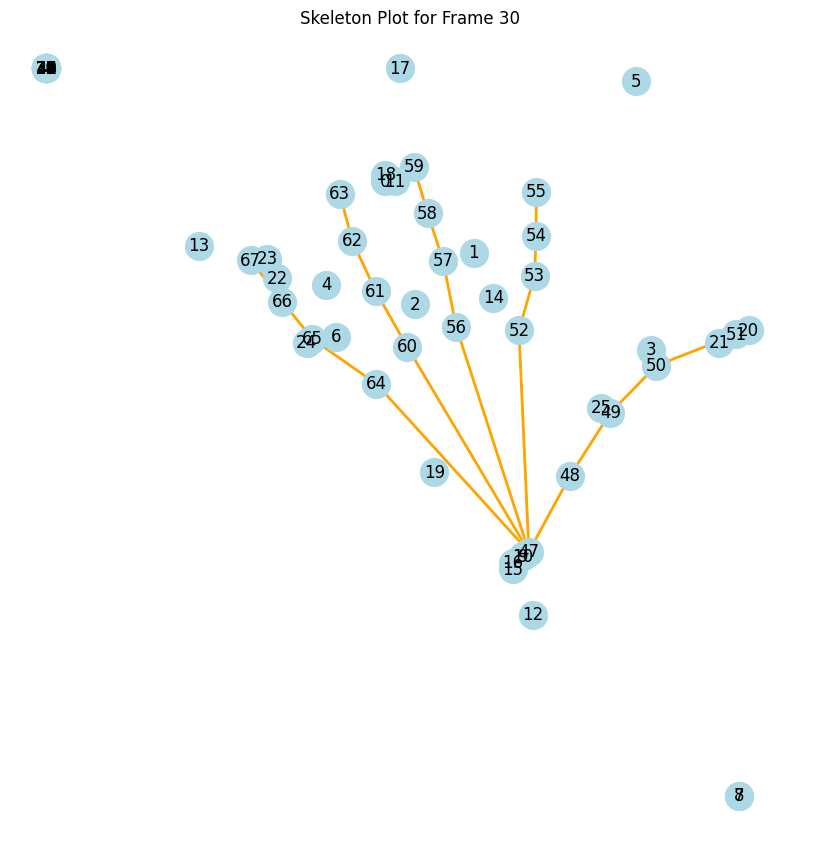

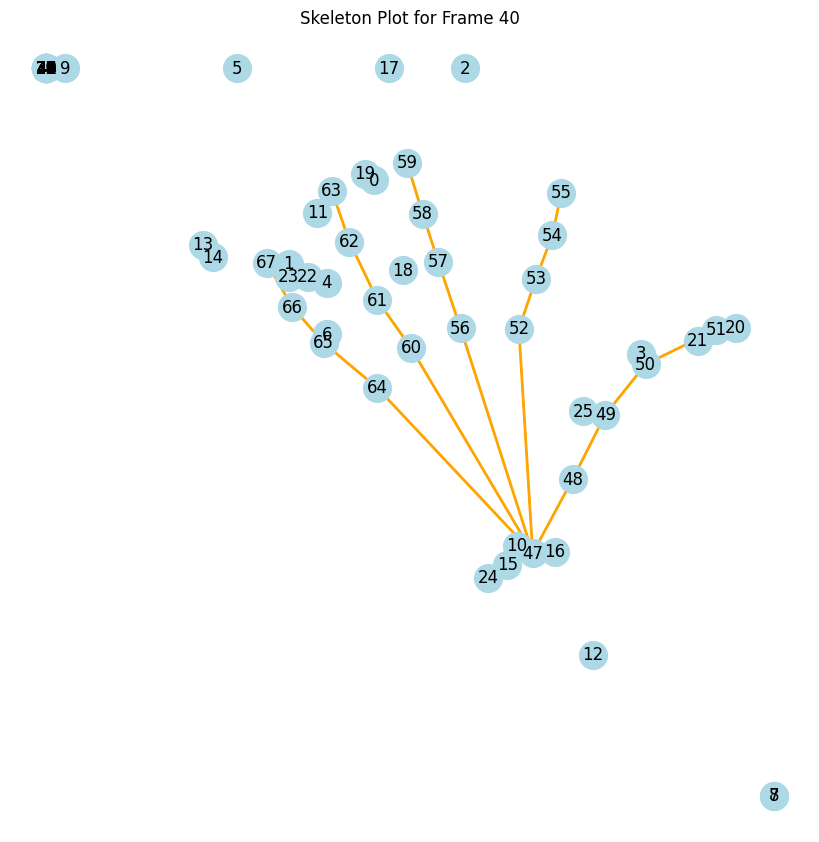

...

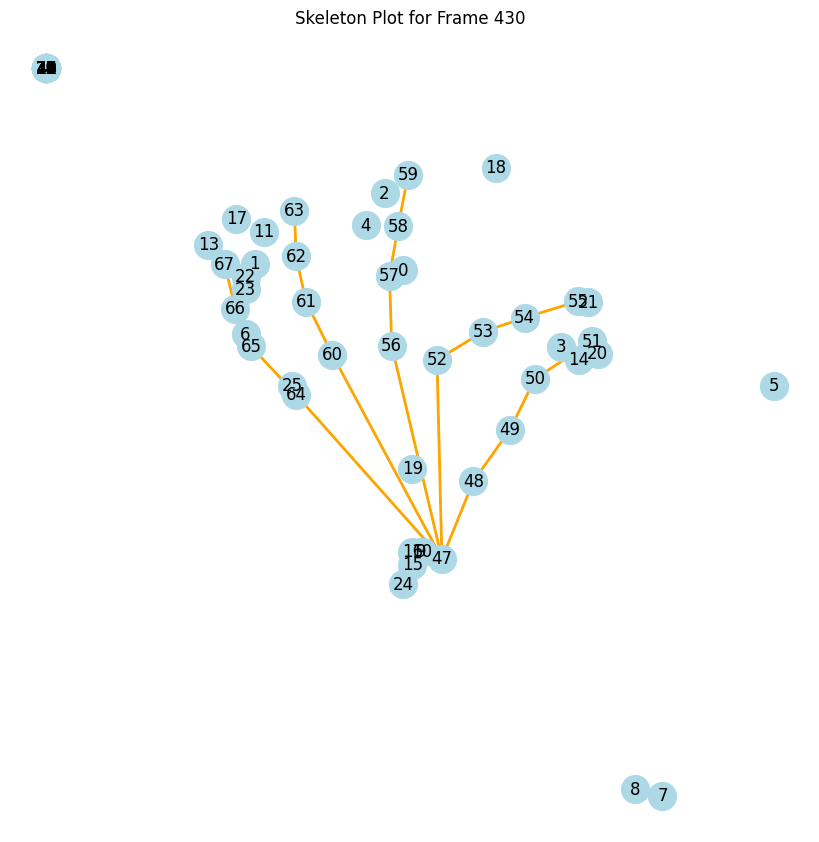

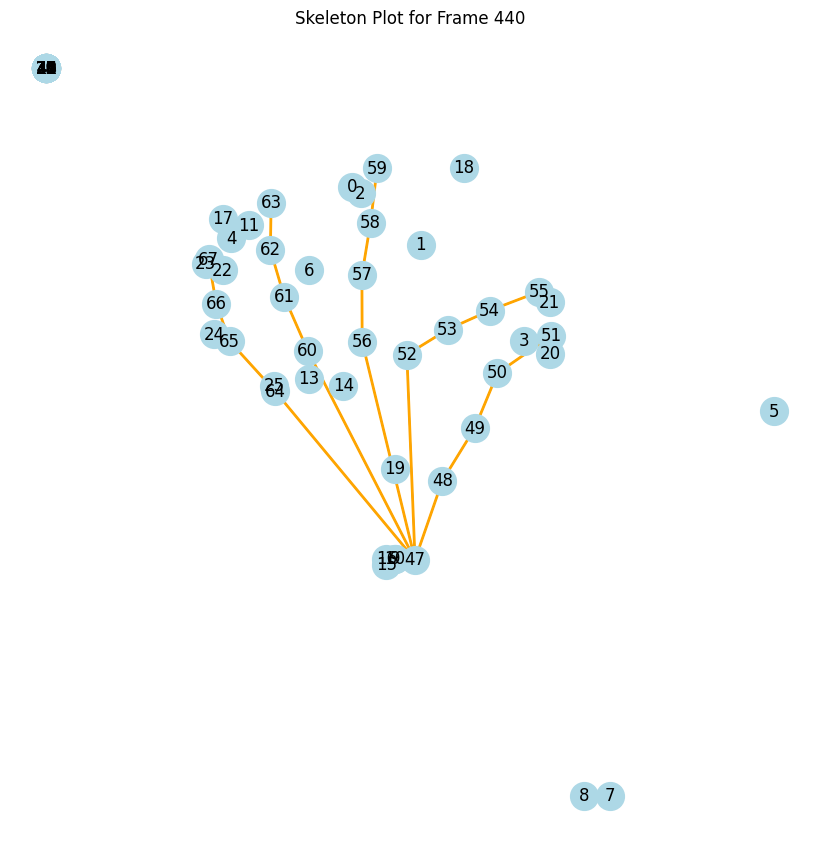

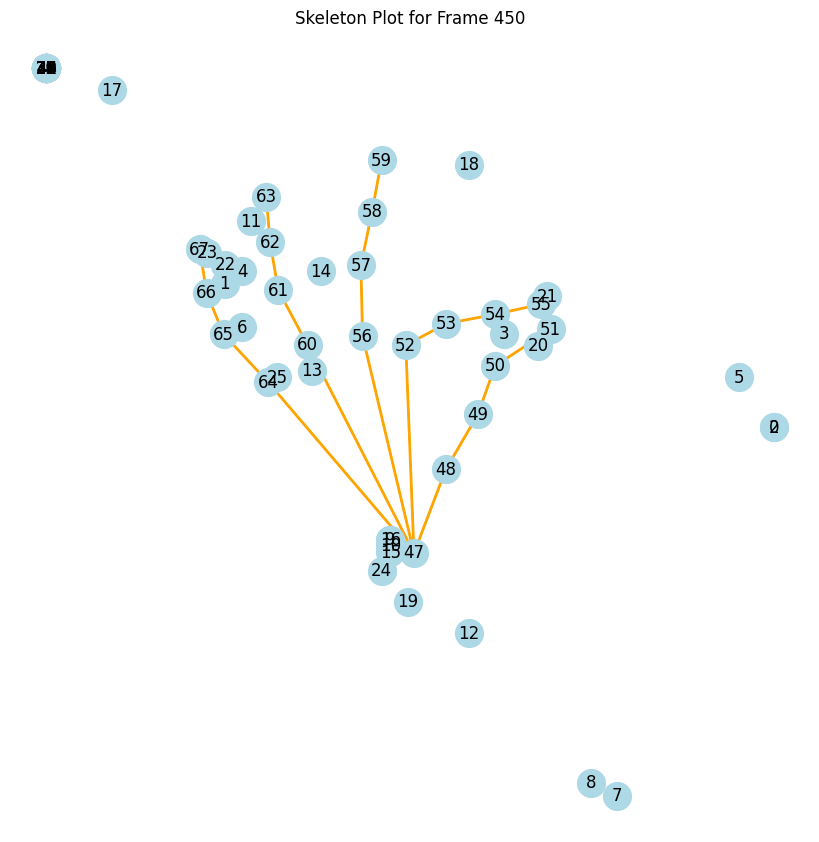

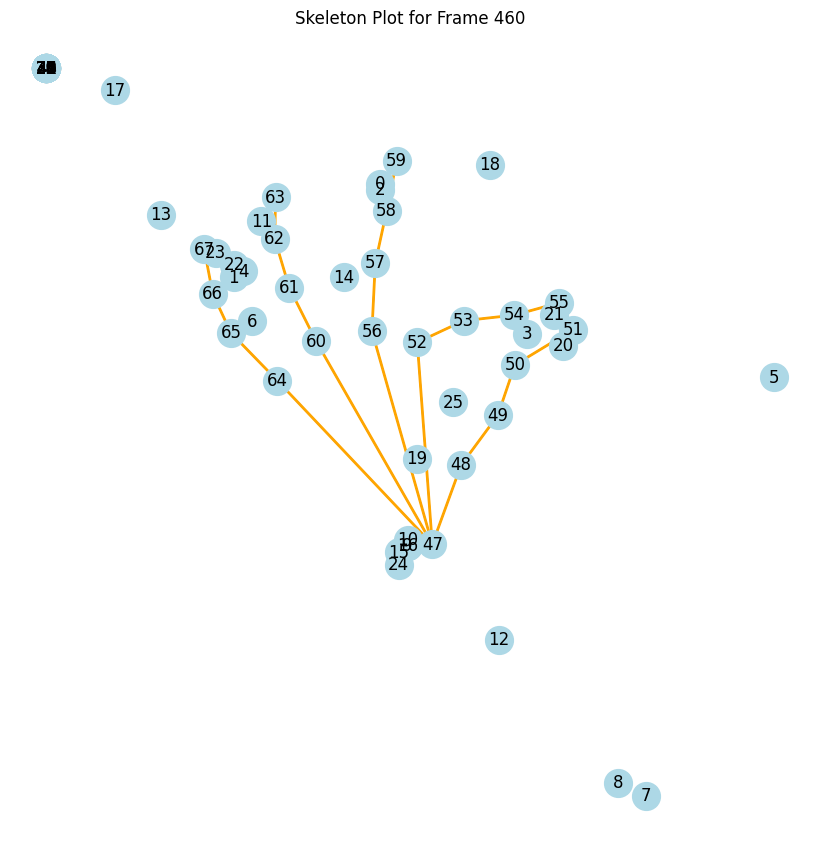

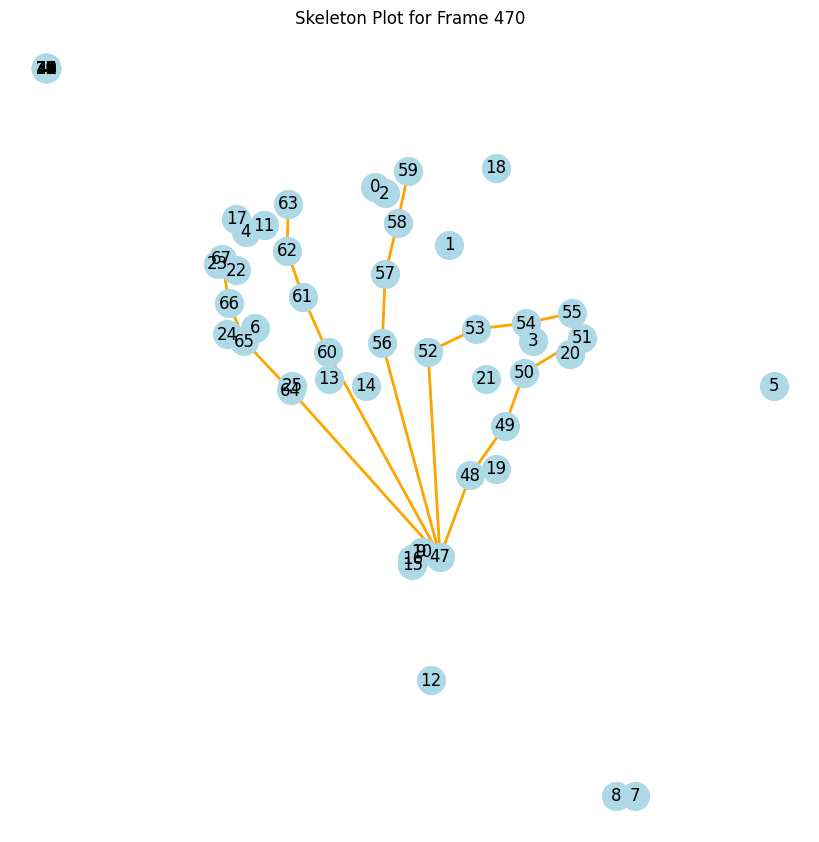

In [4]:
import json
import matplotlib.pyplot as plt
import networkx as nx

# Define the edges based on your skeleton structure
# This is an example; adjust according to your keypoints' connections
skeleton_edges = [
    (47, 48), (48, 49), (49, 50), (50, 51), (20, 51), 
    (47, 52), (52, 53), (53, 54), (54, 55),
    (47, 56), (56, 57), (57, 58), (58, 59),
    (47, 60), (60, 61), (61, 62), (62, 63),
    (47, 64), (64, 65), (65, 66), (66, 67),
   
]

def plot_skeleton_from_json(json_data):
    # Load the JSON data
    json_data = json.loads(json_data)
    
    # Extract the frames from the JSON data
    frames = json_data["data"]["keypoint"]

    # Iterate through frames and plot every 20th frame
    for frame_index in range(len(frames)):
        if frame_index % 10 == 0:
            frame_keypoints = frames[frame_index][0]  # Get keypoints for the current frame

            # Extract (x, y) positions, ignoring confidence scores
            keypoints = [(kp[0], kp[1]) for kp in frame_keypoints]

            # Create a graph to plot keypoints and connections
            G = nx.Graph()
            for idx, (x, y) in enumerate(keypoints):
                G.add_node(idx, pos=(x, y))

            # Add edges based on the skeleton structure
            for edge in skeleton_edges:
                if edge[0] < len(keypoints) and edge[1] < len(keypoints):  # Check if keypoints exist
                    G.add_edge(edge[0], edge[1])

            # Plotting
            plt.figure(figsize=(8, 8))
            pos = nx.get_node_attributes(G, 'pos')
            nx.draw(G, pos, node_size=400, node_color='lightblue', with_labels=True)
            nx.draw_networkx_edges(G, pos, width=2, edge_color='orange')  # Draw edges
            plt.title(f"Skeleton Plot for Frame {frame_index}")
            plt.gca().invert_yaxis()
            plt.show()

# Example usage
# Call the function to plot the skeleton for every 20th frame
plot_skeleton_from_json(json_data)


C:\Users\B Vasundhara\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\scipy\__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.26.4
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


Peak values at detected indices: [311.80032497 275.39146274 269.48311484 275.34213795 260.29799079
 266.11490775 280.48001627 257.64257113 271.25518778 322.00178892
 314.50533646 263.81457054 277.53655712 305.30747941 300.94445832
 249.24290232 292.40828894 288.31018758 280.35798729 289.72115283
 258.31508645 193.09302358 150.87677085 143.60933047  99.21173072
 112.32615824 111.16245645]


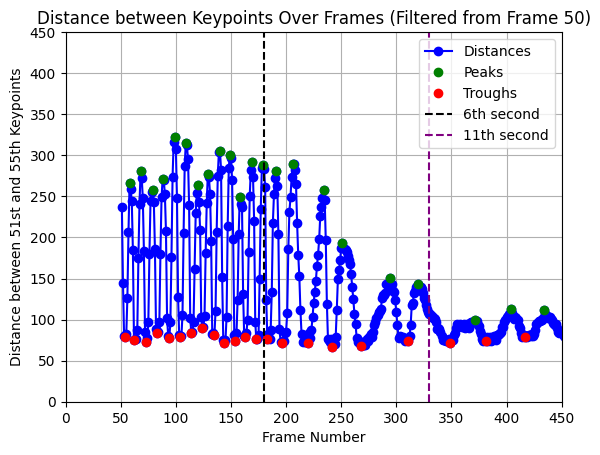

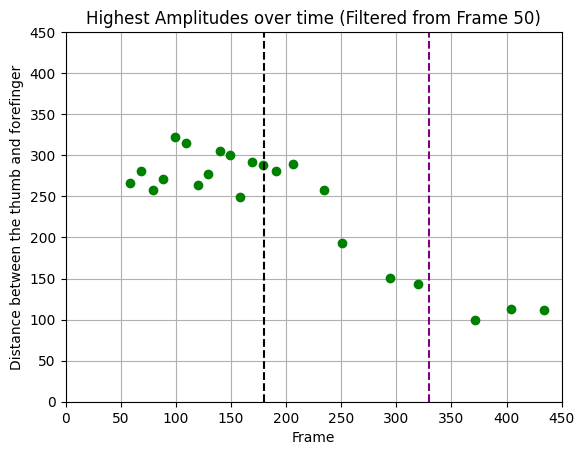

In [5]:
import json
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks

# Assuming json_data is a string, we need to parse it
if isinstance(json_data, str):
    json_data = json.loads(json_data)

# Prepare a list to store distances for each frame
distances = []

# Get all frames from the JSON data
frames = json_data["data"]["keypoint"]

# Define the distance calculation function
def calculate_distance(x1, y1, x2, y2):
    return np.sqrt((x2 - x1) ** 2 + (y2 - y1) ** 2)

# Iterate through frames and calculate the distance for each
for frame_index in range(len(frames)):
    frame = frames[frame_index][0]

    # Extract (x55, y55, c55) and (x51, y51, c51) for the current frame
    x55, y55, c55 = frame[54]  # 55th keypoint (index 54)
    x51, y51, c51 = frame[50]  # 51st keypoint (index 50)

    # Calculate the distance between the 51st and 55th keypoints
    distance = calculate_distance(x55, y55, x51, y51)

    # Store the calculated distance
    distances.append(distance)

# Convert distances to a numpy array
distances_array = np.array(distances)

# Find local maxima by detecting peaks in distances_array
peaks_indices, _ = find_peaks(distances_array, distance=5, prominence=10)
min_indices, _ = find_peaks(-distances_array, distance=5, prominence=10)
# Extract the highest points (distances) at the found peaks
highest_points = distances_array[peaks_indices]
min_points = distances_array[min_indices]
# Print the peak values for verification
print("Peak values at detected indices:", highest_points)

# Filter out frames before frame 50
start_frame = 50
filtered_distances = distances_array[start_frame:]
filtered_peaks_indices = peaks_indices[peaks_indices >= start_frame] - start_frame
filtered_min_indices = min_indices[min_indices >= start_frame] - start_frame
filtered_highest_points = distances_array[peaks_indices[peaks_indices >= start_frame]]
filtered_min_points = distances_array[min_indices[min_indices >= start_frame]]

# Plot the filtered distances and highlight only the peaks
fig, ax = plt.subplots()
ax.plot(range(start_frame + 1, len(distances) + 1), filtered_distances, marker='o', color='blue', label='Distances')
ax.plot(filtered_peaks_indices + start_frame + 1, filtered_highest_points, marker='o', color='green', linestyle='None', label='Peaks')
ax.plot(filtered_min_indices + start_frame + 1, filtered_min_points, marker='o', color='red', linestyle='None', label='Troughs')
ax.set_xlabel("Frame Number")
ax.set_ylabel("Distance between 51st and 55th Keypoints")
ax.set_title("Distance between Keypoints Over Frames (Filtered from Frame 50)")
ax.set_ylim(0, 450)  # Set Y-axis limit to 450
ax.set_xlim(0, 450)  # Set X-axis limit from 0 to 450

# Adding vertical lines at the 6th second and 11th second
frame_at_6s = 30 * 6
frame_at_11s = 30 * 11
ax.axvline(x=frame_at_6s, color='black', linestyle='--', label='6th second')
ax.axvline(x=frame_at_11s, color='purple', linestyle='--', label='11th second')

ax.legend()
plt.grid(True)
plt.show()

# Plot the peaks only, with filtered frames
figure, ax = plt.subplots()
ax.plot(filtered_peaks_indices + start_frame + 1, filtered_highest_points, marker='o', color='green', linestyle='None')
ax.set_ylim(0, 450)
ax.set_xlim(0, 450)
ax.set_xlabel("Frame")
ax.set_ylabel("Distance between the thumb and forefinger")
ax.set_title('Highest Amplitudes over time (Filtered from Frame 50)')
ax.axvline(x=frame_at_6s, color='black', linestyle='--', label='6th second')
ax.axvline(x=frame_at_11s, color='purple', linestyle='--', label='11th second')
plt.grid(True)
plt.show()

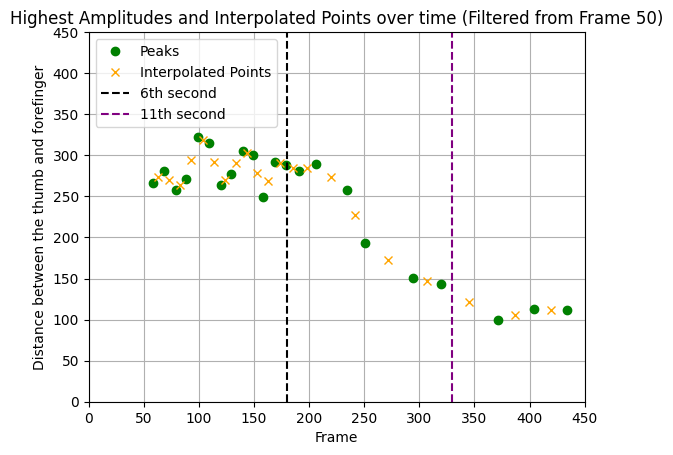

In [6]:
import json
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks

# Assuming json_data is a string, we need to parse it
if isinstance(json_data, str):
    json_data = json.loads(json_data)

# Prepare a list to store distances for each frame
distances = []

# Get all frames from the JSON data
frames = json_data["data"]["keypoint"]

# Define the distance calculation function
def calculate_distance(x1, y1, x2, y2):
    return np.sqrt((x2 - x1) ** 2 + (y2 - y1) ** 2)

# Iterate through frames and calculate the distance for each
for frame_index in range(len(frames)):
    frame = frames[frame_index][0]

    # Extract (x55, y55, c55) and (x51, y51, c51) for the current frame
    x55, y55, c55 = frame[54]  # 55th keypoint (index 54)
    x51, y51, c51 = frame[50]  # 51st keypoint (index 50)

    # Calculate the distance between the 51st and 55th keypoints
    distance = calculate_distance(x55, y55, x51, y51)

    # Store the calculated distance
    distances.append(distance)

# Convert distances to a numpy array
distances_array = np.array(distances)

# Find local maxima by detecting peaks in distances_array
peaks_indices, _ = find_peaks(distances_array, distance=5, prominence=10)
min_indices, _ = find_peaks(-distances_array, distance=5, prominence=10)

# Extract the highest points (distances) at the found peaks
highest_points = distances_array[peaks_indices]
min_points = distances_array[min_indices]

# Filter out frames before frame 50
start_frame = 50
filtered_distances = distances_array[start_frame:]
filtered_peaks_indices = peaks_indices[peaks_indices >= start_frame] - start_frame
filtered_highest_points = distances_array[peaks_indices[peaks_indices >= start_frame]]

# Interpolate between adjacent peaks
# Define the new x values (add midpoints between adjacent peak indices)
new_x_vals = []
for i in range(len(filtered_peaks_indices) - 1):
    new_x_vals.append((filtered_peaks_indices[i] + filtered_peaks_indices[i+1]) // 2)

# Interpolate y-values at these new x points using numpy's interp function
new_y_vals = np.interp(new_x_vals, filtered_peaks_indices, filtered_highest_points)

# Plot the highest amplitudes and interpolated points
figure, ax = plt.subplots()
ax.plot(filtered_peaks_indices + start_frame + 1, filtered_highest_points, marker='o', color='green', linestyle='None', label='Peaks')
ax.plot(np.array(new_x_vals) + start_frame + 1, new_y_vals, marker='x', color='orange', linestyle='None', label='Interpolated Points')
ax.set_ylim(0, 450)
ax.set_xlim(0, 450)
ax.set_xlabel("Frame")
ax.set_ylabel("Distance between the thumb and forefinger")
ax.set_title('Highest Amplitudes and Interpolated Points over time (Filtered from Frame 50)')
frame_at_6s = 30 * 6
frame_at_11s = 30 * 11
ax.axvline(x=frame_at_6s, color='black', linestyle='--', label='6th second')
ax.axvline(x=frame_at_11s, color='purple', linestyle='--', label='11th second')
ax.legend()
plt.grid(True)
plt.show()


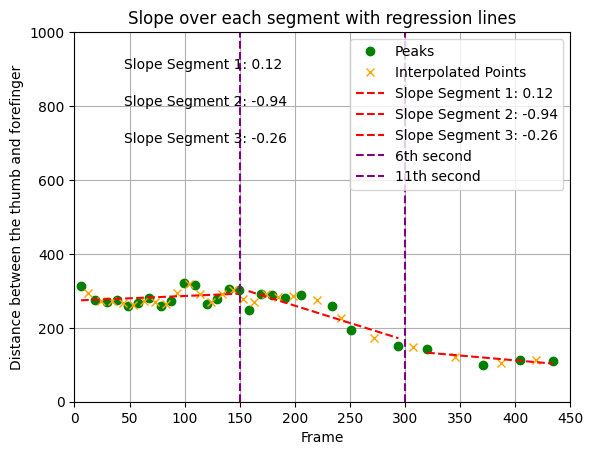

In [13]:
import json
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks

# Assuming json_data is a string, we need to parse it
if isinstance(json_data, str):
    json_data = json.loads(json_data)

# Prepare a list to store distances for each frame
distances = []

# Get all frames from the JSON data
frames = json_data["data"]["keypoint"]

# Define the distance calculation function
def calculate_distance(x1, y1, x2, y2):
    return np.sqrt((x2 - x1) ** 2 + (y2 - y1) ** 2)

# Iterate through frames and calculate the distance for each
for frame_index in range(len(frames)):
    frame = frames[frame_index][0]

    # Extract (x55, y55, c55) and (x51, y51, c51) for the current frame
    x55, y55, c55 = frame[54]  # 55th keypoint (index 54)
    x51, y51, c51 = frame[50]  # 51st keypoint (index 50)

    # Calculate the distance between the 51st and 55th keypoints
    distance = calculate_distance(x55, y55, x51, y51)

    # Store the calculated distance
    distances.append(distance)

# Convert distances to a numpy array
distances_array = np.array(distances)

# Find local maxima by detecting peaks in distances_array
peaks_indices, _ = find_peaks(distances_array, distance=5, prominence=10)

# Filter out frames before frame 50
start_frame = 0
filtered_distances = distances_array[start_frame:]

# Extract peaks for the filtered distances
filtered_peaks_indices = peaks_indices[peaks_indices >= start_frame] - start_frame
filtered_highest_points = distances_array[peaks_indices[peaks_indices >= start_frame]]

# Interpolate between adjacent peaks
new_x_vals = []
for i in range(len(filtered_peaks_indices) - 1):
    new_x_vals.append((filtered_peaks_indices[i] + filtered_peaks_indices[i + 1]) // 2)

new_y_vals = np.interp(new_x_vals, filtered_peaks_indices, filtered_highest_points)

# Define segment boundaries based on time intervals (assuming 30 fps)
segment_frames = [0, 150, 300, 450]  # 5s, 10s, 15s in frames (0-150, 151-300, 301-450)
segment_slopes = []

# Plot the highest amplitudes and interpolated points
figure, ax = plt.subplots()
ax.plot(filtered_peaks_indices + start_frame + 1, filtered_highest_points, marker='o', color='green', linestyle='None', label='Peaks')
ax.plot(np.array(new_x_vals) + start_frame + 1, new_y_vals, marker='x', color='orange', linestyle='None', label='Interpolated Points')

# Calculate slopes and plot regression lines for each segment
for i in range(len(segment_frames) - 1):
    start_idx = segment_frames[i]
    end_idx = segment_frames[i + 1]

    # Filter points for the current segment
    segment_peaks_indices = filtered_peaks_indices[(filtered_peaks_indices >= start_idx) & (filtered_peaks_indices < end_idx)]
    segment_highest_points = filtered_highest_points[(filtered_peaks_indices >= start_idx) & (filtered_peaks_indices < end_idx)]

    # Perform linear regression if we have enough points
    if len(segment_peaks_indices) > 1:
        # Fit a linear regression (degree 1 polynomial)
        slope, intercept = np.polyfit(segment_peaks_indices, segment_highest_points, 1)
        segment_slopes.append(slope)

        # Generate x and y values for the regression line
        x_vals = np.array([segment_peaks_indices[0], segment_peaks_indices[-1]]) + start_frame + 1
        y_vals = slope * np.array([segment_peaks_indices[0], segment_peaks_indices[-1]]) + intercept

        # Plot the regression line
        ax.plot(x_vals, y_vals, color='red', linestyle='--', label=f'Slope Segment {i + 1}: {slope:.2f}')

# Set limits and labels
ax.set_ylim(0, 1000)
ax.set_xlim(0, 450)
ax.set_xlabel("Frame")
ax.set_ylabel("Distance between the thumb and forefinger")
ax.set_title('Slope over each segment with regression lines')

# Vertical lines for specific frames
frame_at_6s = 30 * 5
frame_at_11s = 30 * 10
ax.axvline(x=frame_at_6s, color='purple', linestyle='--', label='6th second')
ax.axvline(x=frame_at_11s, color='purple', linestyle='--', label='11th second')

# Show slope values on the plot
for i, slope in enumerate(segment_slopes):
    ax.text(0.1, 0.9 - i * 0.1, f'Slope Segment {i + 1}: {slope:.2f}', transform=ax.transAxes)

ax.legend()
plt.grid(True)
plt.show()


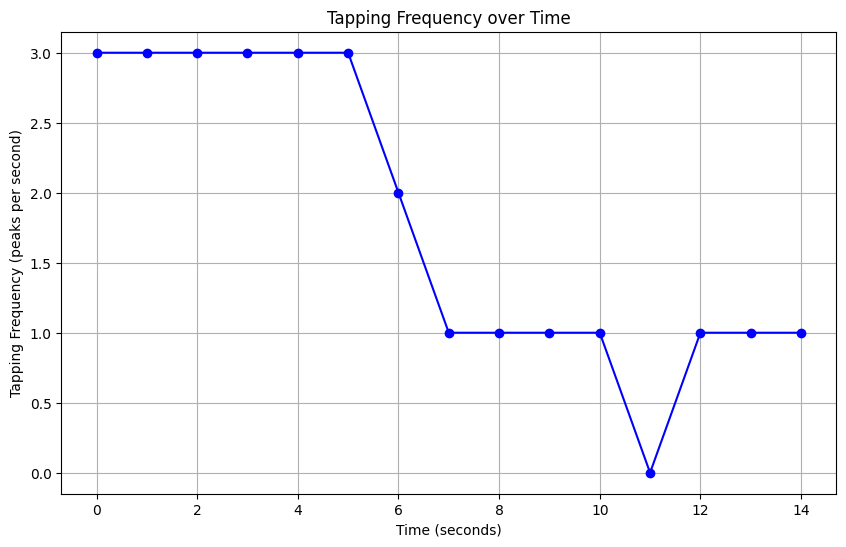

: 

In [15]:
import numpy as np
import matplotlib.pyplot as plt

# Assuming you already have 'peaks_indices' and 'distances_array' from your previous code
# Calculate time in seconds based on frame rate
frame_rate = 30  # Assuming 30 frames per second

# Define time array (in seconds)
time_array = np.arange(len(distances_array)) / frame_rate

# Define sliding window size (e.g., 1 second worth of frames)
window_size = frame_rate  # 30 frames = 1 second

# Prepare a list to store frequency (peaks per second) over time
frequencies = []

# Iterate through the data with a sliding window approach
for i in range(0, len(distances_array) - window_size + 1, window_size):
    # Find peaks within the current window
    current_window_peaks = peaks_indices[(peaks_indices >= i) & (peaks_indices < i + window_size)]
    # Calculate frequency (number of peaks per second)
    frequency = len(current_window_peaks)
    frequencies.append(frequency)

# Define time array for the frequency plot (one point per second)
frequency_time_array = np.arange(len(frequencies))

# Plot the frequency graph
plt.figure(figsize=(10, 6))
plt.plot(frequency_time_array, frequencies, marker='o', color='blue')
plt.xlabel("Time (seconds)")
plt.ylabel("Tapping Frequency (peaks per second)")
plt.title("Tapping Frequency over Time")
plt.grid(True)

# Show the frequency plot
plt.show()


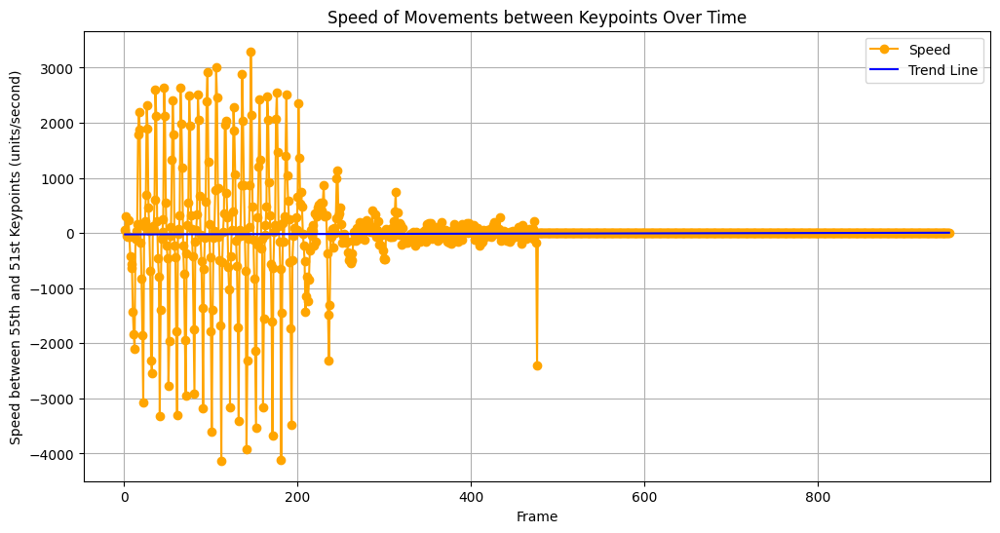

In [10]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression

# Assuming distances_array contains the distances between keypoints and the frame rate is known
frame_rate = 30  # For example, 30 frames per second
time_interval = 1 / frame_rate  # Time difference between frames

# Calculate the speed as the change in distance over the time interval between frames
speeds = np.diff(distances_array) / time_interval

# Create time points for the speed plot (since the speed is calculated between frames)
time_points = np.arange(1, len(speeds) + 1)

# Plot the speed of movements
fig, ax = plt.subplots(figsize=(12, 6))
ax.plot(time_points, speeds, marker='o', color='orange', label='Speed')

# Fit a linear regression line to the speed data
X = time_points.reshape(-1, 1)  # Reshape for sklearn
model = LinearRegression()
model.fit(X, speeds)
regression_line = model.predict(X)

# Plot the regression line
ax.plot(time_points, regression_line, color='blue', linestyle='-', label='Trend Line')

# Set labels and title
ax.set_xlabel("Frame")
ax.set_ylabel("Speed between 55th and 51st Keypoints (units/second)")
ax.set_title("Speed of Movements between Keypoints Over Time")

# Add grid and legend
plt.grid(True)
plt.legend()

# Show plot
plt.show()